In [ ]:
# prompt: connect to the "soil type" folder in my google drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import the necessary libraries
import warnings
warnings.filterwarnings('ignore')
import torch
import numpy as np
import torchvision.transforms.v2 as transforms
import torch, torchvision, os
from torch import nn
import torch.nn.functional as F
from torch.autograd import Variable
#from d2l import torch as d2l
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import os
import random
from shutil import copyfile
import pandas as pd
import cv2
from PIL import Image

#!pip install scipy
#!pip install keras-tuner --upgrade

# sklearn libraries
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from keras.metrics import Precision, Recall
from sklearn.metrics import precision_score, recall_score, f1_score,classification_report
from sklearn.metrics import confusion_matrix

# CNN Librarires
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, AveragePooling2D, BatchNormalization, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
Soil_Image_Path = '/content/drive/"My Drive"/MA5852_A3/Soil_data/"Soil Types"'
!ls {Soil_Image_Path}

'Alluvial soil'  'Clayey soils'  'Laterite soil'  'Loamy soil'	'Sandy loam'  'Sandy soil'


In [ ]:
# Get all the paths
data_dir_list = os.listdir('/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types')
print(data_dir_list)
path, dirs, files = next(os.walk("/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types"))
file_count = len(files)
#print(file_count)

['Sandy soil', 'Laterite soil', 'Loamy soil', 'Clayey soils', 'Sandy loam', 'Alluvial soil']


In [ ]:
# Make new base folder to store TRAIN and TEST Data
original_dataset_dir = '/content/drive/MyDrive/MA5852_A3/Soil_data'
base_dir = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New' # New directory
os.mkdir(base_dir)

In [ ]:
#Create two folders for Training and Testing

# TRAINING DATA DIRECTORY
train_dir = os.path.join(base_dir, 'train')
os.mkdir(train_dir)

# TEST DATA DIRECTORY
test_dir = os.path.join(base_dir, 'test')
os.mkdir(test_dir)


In [ ]:
#Under train folder create the Six folders representing the various types of soil
# 'Sandy soil', 'Laterite soil', 'Loamy soil', 'Clayey soils', 'Sandy loam', 'Alluvial soil'

train_sandy_dir = os.path.join(train_dir, 'Sandy soil')
os.mkdir(train_sandy_dir)

train_laterite_dir = os.path.join(train_dir, 'Laterite soil')
os.mkdir(train_laterite_dir)

train_loamy_dir = os.path.join(train_dir, 'Loamy soil')
os.mkdir(train_loamy_dir)

train_clayey_dir = os.path.join(train_dir, 'Clayey soil')
os.mkdir(train_clayey_dir)

train_sandy_loam_dir = os.path.join(train_dir, 'Sandy loam')
os.mkdir(train_sandy_loam_dir)

train_alluvial_dir = os.path.join(train_dir, 'Alluvial soil')
os.mkdir(train_alluvial_dir)

In [ ]:
# Similary create 6 Folders for the Test Data

test_sandy_dir = os.path.join(test_dir, 'Sandy soil')
os.mkdir(test_sandy_dir)

test_laterite_dir = os.path.join(test_dir, 'Laterite soil')
os.mkdir(test_laterite_dir)

test_loamy_dir = os.path.join(test_dir, 'Loamy soil')
os.mkdir(test_loamy_dir)

test_clayey_dir = os.path.join(test_dir, 'Clayey soil')
os.mkdir(test_clayey_dir)

test_sandy_loam_dir = os.path.join(test_dir, 'Sandy loam')
os.mkdir(test_sandy_loam_dir)

test_alluvial_dir = os.path.join(test_dir, 'Alluvial soil')
os.mkdir(test_alluvial_dir)

In [ ]:
# ['Sandy soil', 'Laterite soil', 'Loamy soil', 'Clayey soils', 'Sandy loam', 'Alluvial soil']

# Sandy Soil Directory
SANDY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Sandy soil/'
TRAINING_SANDY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/Sandy soil/'
TEST_SANDY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/Sandy soil/'

# Laterite Soil
LATERITE_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Laterite soil/'
TRAINING_LATERITE_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/Laterite soil/'
TEST_LATERITE_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/Laterite soil/'

# Loamy Soil
LOAMY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Loamy soil/'
TRAINING_LOAMY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/Loamy soil/'
TEST_LOAMY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/Loamy soil/'

# Clayey soil
CLAYEY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Clayey soils/'
TRAINING_CLAYEY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/Clayey soil/'
TEST_CLAYEY_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/Clayey soil/'


# Sandy loam
SANDY_LOAM_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Sandy loam/'
TRAINING_SANDY_LOAM_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/Sandy loam/'
TEST_SANDY_LOAM_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/Sandy loam/'

# Alluvial Soil
ALLUVIAL_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Alluvial soil/'
TRAINING_ALLUVIAL_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/Alluvial soil/'
TEST_ALLUVIAL_SOIL_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/Alluvial soil/'

# EDA

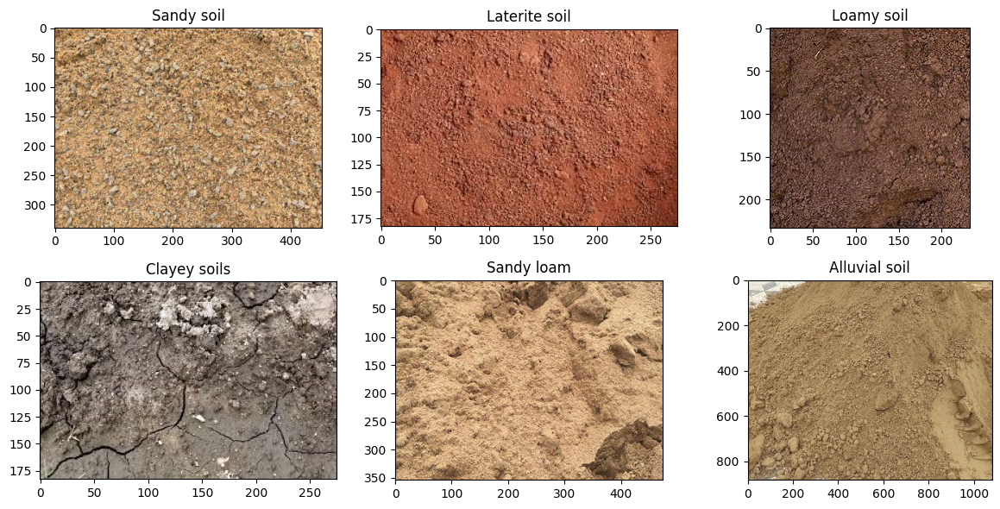

IMAGE MODE: RGBA


In [ ]:
# List all the directories
soil_directories = [
    ('Sandy soil', SANDY_SOIL_DIR),
    ('Laterite soil', LATERITE_SOIL_DIR),
    ('Loamy soil', LOAMY_SOIL_DIR),
    ('Clayey soils', CLAYEY_SOIL_DIR),
    ('Sandy loam', SANDY_LOAM_DIR),
    ('Alluvial soil', ALLUVIAL_SOIL_DIR)
]

# Plot one image of each soil type
fig, axs = plt.subplots(2, 3, figsize=(12, 6))

for i, (soil_type, directory) in enumerate(soil_directories):
    row = i // 3
    col = i % 3
    files = os.listdir(directory)
    image_path = os.path.join(directory, files[0])  # Select the first image of each soil type
    image = mpimg.imread(image_path)
    axs[row, col].imshow(image)
    axs[row, col].set_title(soil_type)
    #axs[row, col].axis('off')

plt.tight_layout()
plt.show()
###################################################

# Image Path File
img = Image.open('/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Laterite soil/laterite 20.png')

# Display the image
img.show()
# Check the image mode
image_mode = img.mode
print("IMAGE MODE:", image_mode)

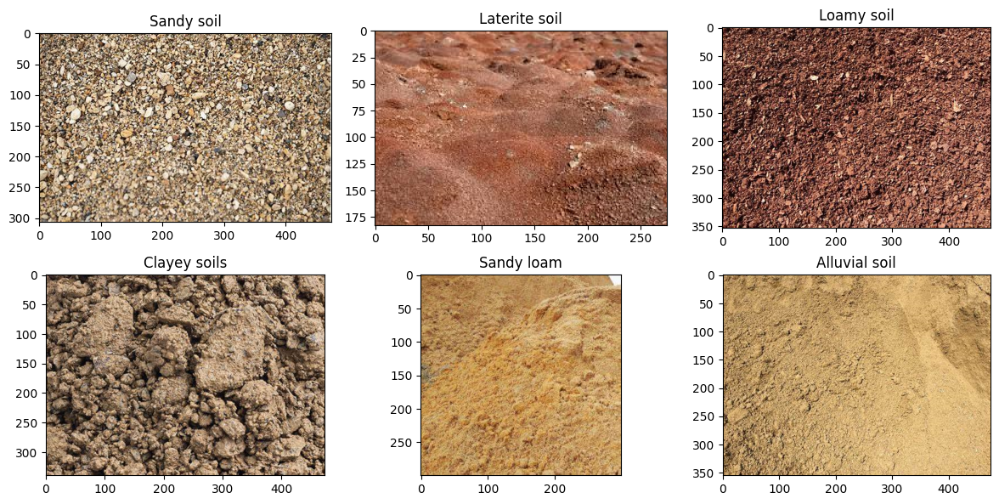

In [ ]:
# Using CV2

# Plot one image of each soil type
fig, axs = plt.subplots(2, 3, figsize=(12,6))

for i, (soil_type, directory) in enumerate(soil_directories):
    row = i // 3
    col = i % 3
    files = os.listdir(directory)
    image_path = os.path.join(directory, files[3])  # Select the second image of each soil type
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    axs[row, col].imshow(image)
    axs[row, col].set_title(soil_type)
    #axs[row, col].axis('off')

plt.tight_layout()
plt.show()

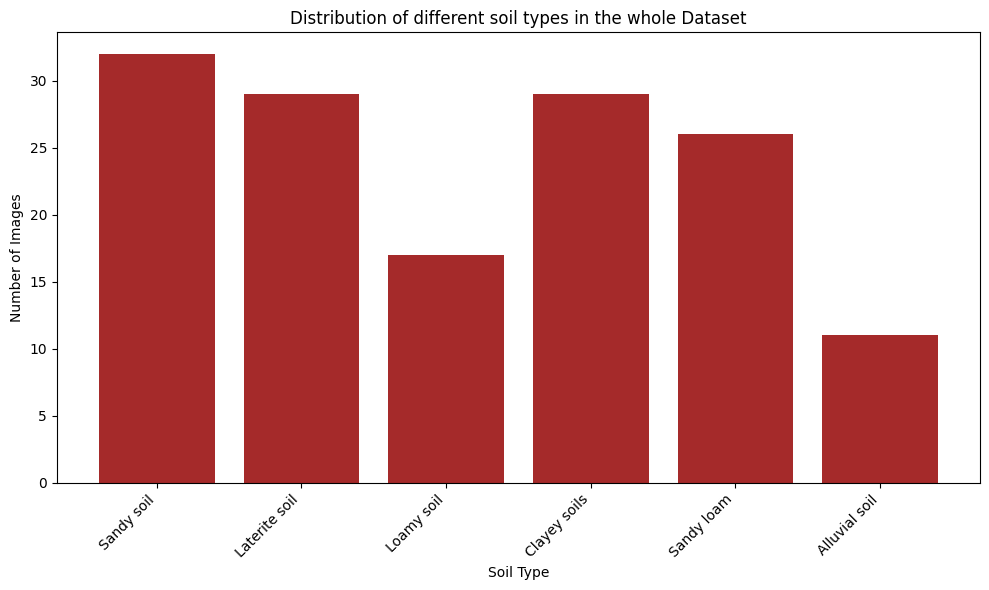

In [ ]:
# Count number of images for each soil type
soil_counts = []
for soil_type, directory in soil_directories:
    files = os.listdir(directory)
    soil_counts.append(len(files))

# Plot bar plot
plt.figure(figsize=(10, 6))
soil_types = [soil_type for soil_type, _ in soil_directories]
plt.bar(soil_types, soil_counts, color='brown')
plt.xlabel('Soil Type')
plt.ylabel('Number of Images')
plt.title('Distribution of different soil types in the whole Dataset')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# Count and print number of images for each soil type
for soil_type, directory in soil_directories:
    files = os.listdir(directory)
    print(f"Total {soil_type} images are: {len(files)}")

Total Sandy soil images are: 32
Total Laterite soil images are: 29
Total Loamy soil images are: 17
Total Clayey soils images are: 29
Total Sandy loam images are: 26
Total Alluvial soil images are: 11


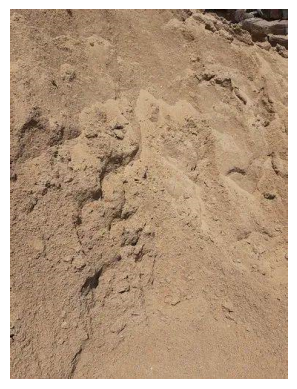

Width: 375
Height: 499


In [ ]:
# Function to view the image dimensions using the image path
def get_image_size(image_path):
    with Image.open(image_path) as img:
        width, height = img.size
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    return width, height

image_path = "/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Alluvial soil/alluvial 4.png"
width, height = get_image_size(image_path)
print("Width:", width)
print("Height:", height)

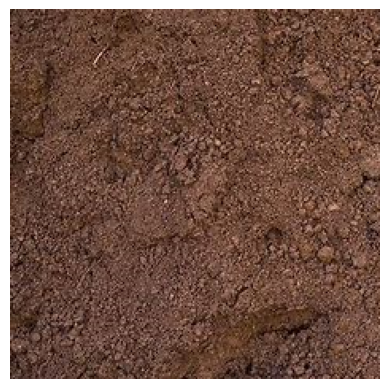

Width: 233
Height: 233


In [ ]:
image_path = "/content/drive/MyDrive/MA5852_A3/Soil_data/Soil Types/Loamy soil/loamy 11.png"
width, height = get_image_size(image_path)
print("Width:", width)
print("Height:", height)

#### Note: Now, since there are images with varying image dimensions, we apply data transformations to normalize these images to improve the model performance.

# Data Partioning

In [ ]:
import os
import random
from shutil import copyfile

# Set seed
random.seed(99)

# Split the Data
def split_data(SOURCE, TRAINING, TEST, SPLIT_SIZE):
    files = []
    for filename in os.listdir(SOURCE):
        file = SOURCE + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
        else:
            print(filename + " is zero length, so ignoring.")

    training_length = int(len(files) * SPLIT_SIZE)
    test_length = int(len(files) - training_length)

    # Shuffle the list of files using the seeded random number generator
    random.shuffle(files)

    training_set = files[:training_length]
    test_set = files[training_length:]

    for filename in training_set:
        this_file = SOURCE + filename
        destination = TRAINING + filename
        copyfile(this_file, destination)

    for filename in test_set:
        this_file = SOURCE + filename
        destination = TEST + filename
        copyfile(this_file, destination)

In [ ]:
split_size = .75  # Split the Data 75:25

split_data(SANDY_SOIL_DIR, TRAINING_SANDY_SOIL_DIR, TEST_SANDY_SOIL_DIR, split_size)
split_data(LATERITE_SOIL_DIR, TRAINING_LATERITE_SOIL_DIR, TEST_LATERITE_SOIL_DIR, split_size)
split_data(LOAMY_SOIL_DIR, TRAINING_LOAMY_SOIL_DIR, TEST_LOAMY_SOIL_DIR, split_size)
split_data(CLAYEY_SOIL_DIR, TRAINING_CLAYEY_SOIL_DIR, TEST_CLAYEY_SOIL_DIR, split_size)
split_data(SANDY_LOAM_DIR, TRAINING_SANDY_LOAM_DIR, TEST_SANDY_LOAM_DIR, split_size)
split_data(ALLUVIAL_SOIL_DIR, TRAINING_ALLUVIAL_SOIL_DIR, TEST_ALLUVIAL_SOIL_DIR, split_size)

In [ ]:
soil_images_folders_train = ['Sandy soil', 'Laterite soil', 'Loamy soil', 'Clayey soil', 'Sandy loam', 'Alluvial soil']
for i in soil_images_folders_train:
  print('{} ----> Number of images for Training are : '.format(i)+str(len(os.listdir('/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/'+i+'/'))))

Sandy soil ----> Number of images for Training are : 24
Laterite soil ----> Number of images for Training are : 21
Loamy soil ----> Number of images for Training are : 12
Clayey soil ----> Number of images for Training are : 21
Sandy loam ----> Number of images for Training are : 19
Alluvial soil ----> Number of images for Training are : 8


In [ ]:
soil_images_folders_test = ['Sandy soil', 'Laterite soil', 'Loamy soil', 'Clayey soil', 'Sandy loam', 'Alluvial soil']
for i in soil_images_folders_test:
  print('{} ----> Number of images for Test Data are : '.format(i)+str(len(os.listdir('/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/'+i+'/'))))

Sandy soil ----> Number of images for Test Data are : 8
Laterite soil ----> Number of images for Test Data are : 8
Loamy soil ----> Number of images for Test Data are : 5
Clayey soil ----> Number of images for Test Data are : 8
Sandy loam ----> Number of images for Test Data are : 7
Alluvial soil ----> Number of images for Test Data are : 3


# Data Augmentation

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
# Define the Image Dimensions
img_width = 256
img_height = 256
batch_size= 64

In [ ]:
# Generate New data for the Training

TRAINING_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/' # Training Directory
TEST_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/' # Test Directory

train_data_gen = ImageDataGenerator(rescale=1/255.0,  # Normalize the pixel
                                    rotation_range=35,  # Rotate the images by up to 45 degrees
                                    width_shift_range=0.2,  # Randomly shift the width by up to 20%
                                    height_shift_range=0.2,  # Randomly shift the height by up to 20%
                                    shear_range=0.2,  # Shear intensity
                                    zoom_range=0.4,  # Random Zoom up to 40%
                                    horizontal_flip=True,  # Randomly flip images horizontally
                                    #fill_mode= 'reflect',
                                    fill_mode= 'wrap', # wrap images around the edge
                                    #fill_mode= 'nearest',
                                    )

train_generator = train_data_gen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    target_size=(img_height, img_width),
                                                    shuffle=True
                                                     )

# Generate New data for the Testing

# Data generator for testing data
test_data_gen = ImageDataGenerator(rescale=1./255.0)

test_generator = test_data_gen.flow_from_directory(
    TEST_DIR,
    batch_size=batch_size,
    class_mode='categorical',
    target_size=(img_height, img_width),
    shuffle=False)

Found 105 images belonging to 6 classes.
Found 39 images belonging to 6 classes.


##### Create a new directory to store the Augmented Data

In [ ]:
from tensorflow.keras.preprocessing.image import load_img  # Importing load_img function

# Path to the directory where augmented images are saved
augmented_images_dir = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/augmented_data/'

# Create the directory if it does not exist
os.makedirs(augmented_images_dir, exist_ok=True)

# Save augmented images from the training set
for i in range(10):  # Save 10 augmented images
    batch = train_generator.next()
    for j in range(len(batch[0])):
        image = batch[0][j]
        plt.imshow(image)
        plt.axis('off')
        plt.savefig(os.path.join(augmented_images_dir, f"augmented_image_{i * len(batch[0]) + j}.png"))
        plt.close()

In [ ]:
from tensorflow.keras.preprocessing.image import load_img  # Importing load_img function
soil_images_folders_augmented = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/augmented_data/'

# List files in the directory
files = os.listdir(soil_images_folders_augmented)

# Count the number of files
num_files = len(files)

print("Number of the Augmented Images:", num_files)

Number of the Augmented Images: 407


### Augmented Images using fill_mode = 'wrap'

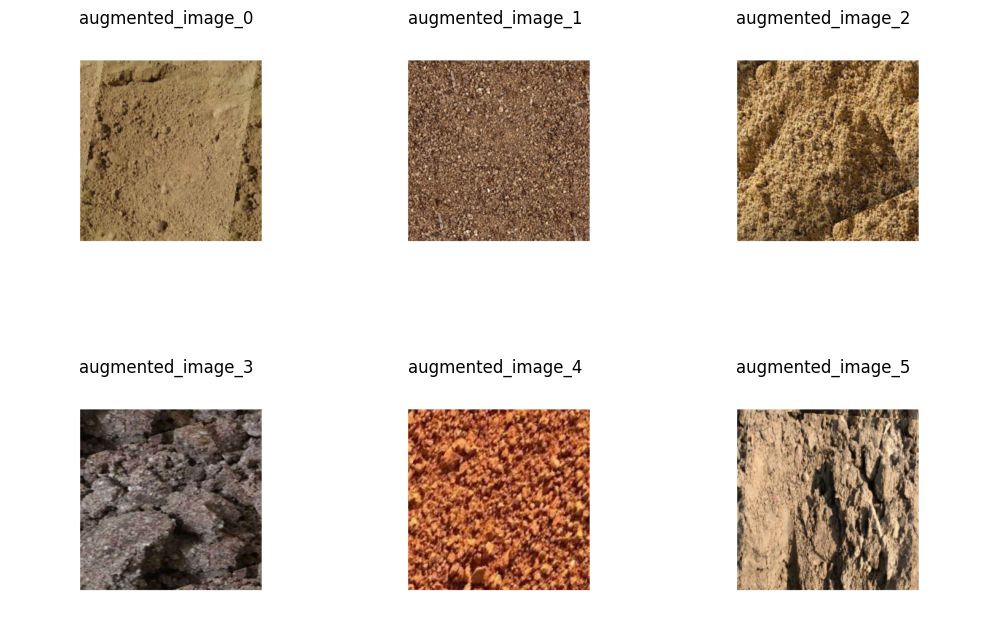

In [ ]:
############### View the Images ####################
## List  image files in the directory
augmented_images_dir = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/augmented_data/'
augmented_image_files = os.listdir(augmented_images_dir)

# Create a subplot with 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(10, 8))

# Flatten the axes array to easily iterate over subplots
axes = axes.ravel()

# Loop through the first 6 images and display them along with their labels
for i in range(6):
    img_file = augmented_image_files[i]
    img_path = os.path.join(augmented_images_dir, img_file)
    img = load_img(img_path)

    # Display the image
    axes[i].imshow(img)
    axes[i].axis('off')

    # Get the image label
    label = img_file.split('.')[0]

    # Display the label as the title of the subplot
    axes[i].set_title(label)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
### Augmented Images using fill_mode = 'nearest'

Found 105 images belonging to 6 classes.


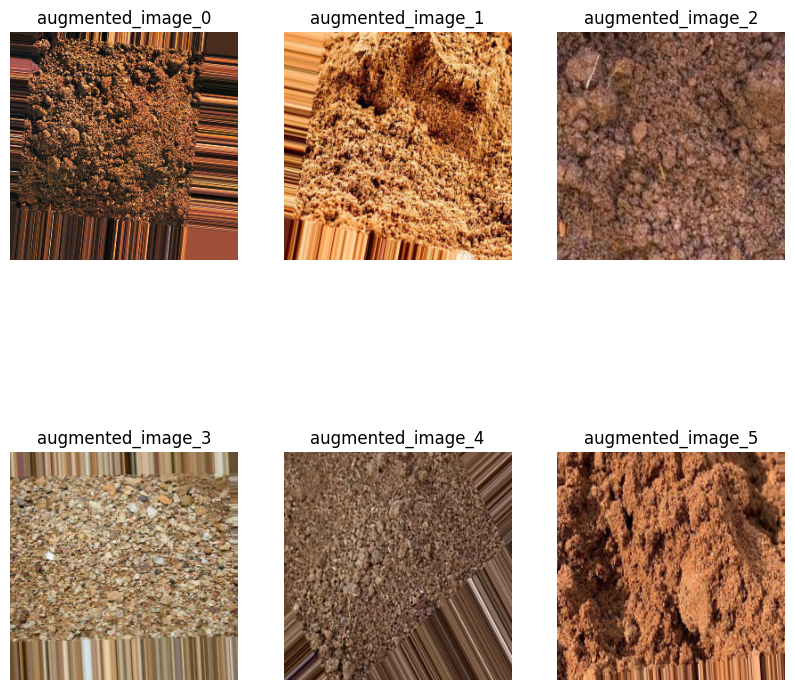

In [ ]:
# Generate New data for the Training

TRAINING_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/train/' # Training Directory
TEST_DIR = '/content/drive/MyDrive/MA5852_A3/Soil_Data_New/test/' # Test Directory

train_data_gen = ImageDataGenerator(rescale=1/255.0,  # Normalize the pixel
                                    rotation_range=35,  # Rotate the images by up to 45 degrees
                                    width_shift_range=0.2,  # Randomly shift the width by up to 20%
                                    height_shift_range=0.2,  # Randomly shift the height by up to 20%
                                    shear_range=0.2,  # Shear intensity
                                    zoom_range=0.4,  # Random Zoom up to 40%
                                    horizontal_flip=True,  # Randomly flip images horizontally
                                    #fill_mode= 'reflect',
                                    #fill_mode= 'wrap',
                                    fill_mode= 'nearest',
                                    )

train_generator = train_data_gen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    target_size=(img_height, img_width),
                                                    shuffle=True
                                                     )

############### View the Images ####################
# Generate a batch of augmented images and labels
augmented_images, labels = train_generator.next()

# Display the augmented images along with their labels
# Display the augmented images along with their labels
plt.figure(figsize=(10, 10))
for i in range(6):  # Display 9 images
    ax = plt.subplot(2, 3, i + 1)
    plt.imshow(augmented_images[i])
    plt.title(f'augmented_image_{i}')  # Change the title
    plt.axis("off")
plt.show()

# Build, train, and deploy a neural network.
####a) Propose a CNN for the classification. Justify your choice.
####b) Report and discuss the performance of the proposed CNN models.
####c) Apply techniques such as dropout, early stop, batch normalisation to the CNN (in (b)) and investigate their impacts on the performance on the CNN.
####d) Apply hyperparameter tuning to the CNN from (d)
####e) Discuss limitations of the proposed model for the classification task

## Part 1 : Basic CNN model

### Creating a 'balanced_weight' to solve the class imbalance amongst various soil types

In [ ]:
# Get class indices
class_indices = train_generator.classes
print(class_indices)


# Calculate class weights
class_labels = np.unique(train_generator.classes)
print(class_labels)

class_weights = compute_class_weight(class_weight = "balanced",classes = np.unique(class_indices), y = class_indices)

class_weights = dict(zip(np.unique(class_indices), class_weights))
class_weights

[0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
[0 1 2 3 4 5]


{0: 2.1875,
 1: 0.8333333333333334,
 2: 0.8333333333333334,
 3: 1.4583333333333333,
 4: 0.9210526315789473,
 5: 0.7291666666666666}

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight


model = Sequential([
    Conv2D(32, (5, 5), activation='relu', input_shape=(img_height, img_width, 3)),  # Convolutional Layer 1
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu'), # Convolutional Layer 2
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'), # Convolutional Layer 3
    MaxPooling2D(2, 2),

    Flatten(),
    Dense(512, activation='relu'), # Dense Layer 1
    Dense(256, activation='relu'), # Dense Layer 2
    Dense(6, activation='softmax') # Output Layer

    ])

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 252, 252, 32)      2432      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 126, 126, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 124, 124, 64)      18496     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 62, 62, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_11 (Conv2D)          (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 30, 30, 128)      

In [ ]:
# Compile the model
model.compile(optimizer='Adam',
              loss='categorical_crossentropy',
              metrics=['accuracy']
              )

# Train the model
history = model.fit_generator(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs= 30,
                    verbose = 1,
                    validation_data=test_generator,
                    validation_steps=len(test_generator),
                    class_weight = class_weights
                    )

Epoch 1/30
2/2 [==============================] - 7s 3s/step - loss: 8.5727 - accuracy: 0.1333 - val_loss: 6.7034 - val_accuracy: 0.2051
Epoch 2/30
2/2 [==============================] - 3s 2s/step - loss: 5.2568 - accuracy: 0.2190 - val_loss: 2.0891 - val_accuracy: 0.2051
Epoch 3/30
2/2 [==============================] - 3s 2s/step - loss: 1.8812 - accuracy: 0.1143 - val_loss: 1.7563 - val_accuracy: 0.2051
Epoch 4/30
2/2 [==============================] - 4s 2s/step - loss: 1.8012 - accuracy: 0.1905 - val_loss: 1.7209 - val_accuracy: 0.2051
Epoch 5/30
2/2 [==============================] - 3s 1s/step - loss: 1.7387 - accuracy: 0.2190 - val_loss: 1.6594 - val_accuracy: 0.2821
Epoch 6/30
2/2 [==============================] - 3s 2s/step - loss: 1.6860 - accuracy: 0.2857 - val_loss: 1.6330 - val_accuracy: 0.3590
Epoch 7/30
2/2 [==============================] - 5s 4s/step - loss: 1.6414 - accuracy: 0.3143 - val_loss: 1.5497 - val_accuracy: 0.2821
Epoch 8/30
2/2 [=========================

In [ ]:
model.evaluate(test_generator)

1/1 [==============================] - 1s 579ms/step - loss: 0.9449 - accuracy: 0.6410


[0.9448897242546082, 0.6410256624221802]

In [ ]:
# Evaluate the model
#est_loss, test_accuracy, test_precision, test_recall = model.evaluate(test_generator)
test_loss, test_accuracy = model.evaluate(test_generator)

# Get true labels
true_classes = test_generator.classes

predictions = model.predict(test_generator)
# Convert probabilities to class labels
predicted_classes = predictions.argmax(axis=1)

# Print evaluation metrics
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy * 100)

1/1 [==============================] - 1s 579ms/step
Test Loss: 0.9448897242546082
Test Accuracy: 64.10256624221802


In [ ]:
# Predictions on the test data
predictions = model.predict(test_generator)

# Convert probabilities to class labels
predicted_classes = predictions.argmax(axis=1)

# Map predicted class indices to class labels
class_labels = list(train_generator.class_indices.keys())
predicted_labels = [class_labels[i] for i in predicted_classes]

# Print the predicted classes and labels
print("Predicted Classes:", predicted_classes)
print("Class Labels:", class_labels)
print("Predicted Labels: ", predicted_labels)

# Classification Report

# Predictions on the test data
#predictions = model.predict(test_generator)
#predicted_classes = np.argmax(predictions, axis=1)

# Get true labels
true_classes = test_generator.classes

# Get class labels
class_labels = list(test_generator.class_indices.keys())

# Build classification report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)

# Print the classification report
print("\n Classification Report :\n" ,report)

1/1 [==============================] - 1s 876ms/step
Predicted Classes: [1 0 0 1 5 1 1 5 5 1 1 2 2 4 2 2 3 3 2 3 3 4 3 3 5 4 5 5 4 0 5 5 5 5 5 5 4
 5 5]
Class Labels: ['Alluvial soil', 'Clayey soil', 'Laterite soil', 'Loamy soil', 'Sandy loam', 'Sandy soil']
Predicted Labels:  ['Clayey soil', 'Alluvial soil', 'Alluvial soil', 'Clayey soil', 'Sandy soil', 'Clayey soil', 'Clayey soil', 'Sandy soil', 'Sandy soil', 'Clayey soil', 'Clayey soil', 'Laterite soil', 'Laterite soil', 'Sandy loam', 'Laterite soil', 'Laterite soil', 'Loamy soil', 'Loamy soil', 'Laterite soil', 'Loamy soil', 'Loamy soil', 'Sandy loam', 'Loamy soil', 'Loamy soil', 'Sandy soil', 'Sandy loam', 'Sandy soil', 'Sandy soil', 'Sandy loam', 'Alluvial soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy loam', 'Sandy soil', 'Sandy soil']

 Classification Report :
                precision    recall  f1-score   support

Alluvial soil       0.67      0.67      0.67         3
  Claye

2/2 [==============================] - 0s 22ms/step


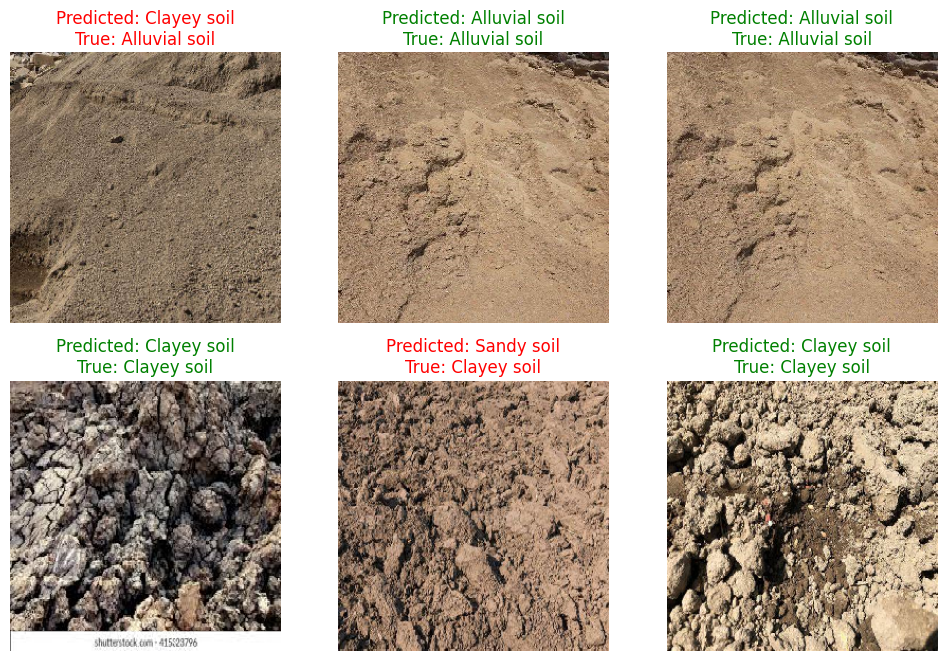

In [ ]:
# Get a batch of images and labels from the test generator
images, true_labels = next(test_generator)

# Make predictions on the batch of images
predictions = model.predict(images)
predicted_labels = np.argmax(predictions, axis=1)
predicted_probs = np.max(predictions, axis=1)

# Get class labels
class_labels = list(train_generator.class_indices.keys())

# Define colors for correct and incorrect predictions
correct_color = 'green'
incorrect_color = 'red'

# Plot the images with predicted and true labels
plt.figure(figsize=(10, 10))
for i in range(6):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    if predicted_labels[i] == np.argmax(true_labels[i]):
        label_color = correct_color
    else:
        label_color = incorrect_color
    plt.title(f"Predicted: {class_labels[predicted_labels[i]]}\nTrue: {class_labels[np.argmax(true_labels[i])]}",
              color=label_color)
    plt.xlabel(f"Probability: {predicted_probs[i]:.2f}", color=label_color)
    plt.axis('off')

plt.tight_layout()
plt.show()

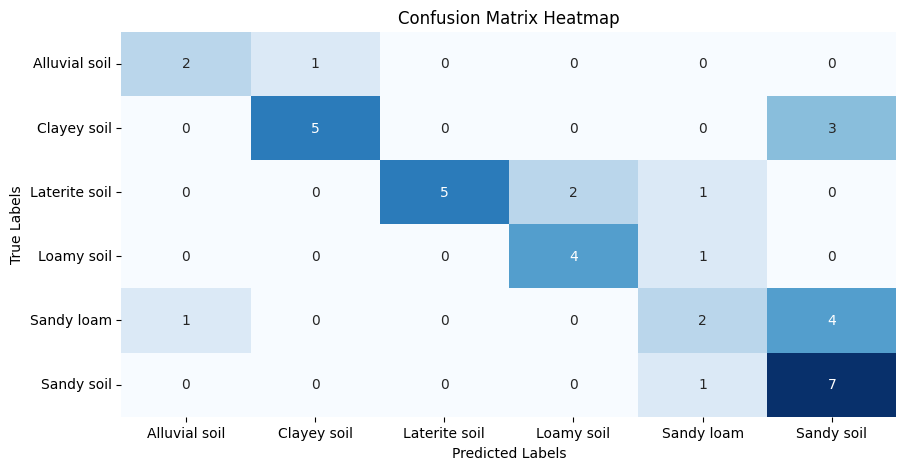

In [ ]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### Plot the Train vs Test Accuracy

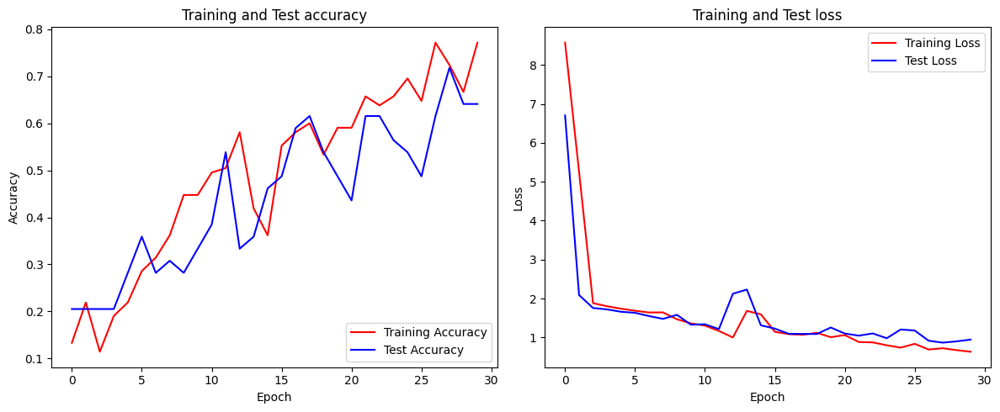

In [ ]:
# Plot the Train vs Test Accuracy
acc=history.history['accuracy']
test_acc = history.history['val_accuracy']
loss = history.history['loss']
test_loss = history.history['val_loss']

epochs=range(len(acc))

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Plot Training and Test accuracy
axes[0].plot(epochs, acc, 'r', label="Training Accuracy")
axes[0].plot(epochs, test_acc, 'b', label="Test Accuracy")
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Training and Test accuracy')
axes[0].legend(loc='lower right')

# Plot Training and Test loss
axes[1].plot(epochs, loss, 'r', label="Training Loss")
axes[1].plot(epochs, test_loss, 'b', label="Test Loss")
axes[1].legend(loc='upper right')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Training and Test loss')

plt.tight_layout()
plt.show()

# Part 2.  USING Only Batch Normalization

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
# Get class indices
class_indices = train_generator.classes
print(class_indices)


# Calculate class weights
class_labels = np.unique(train_generator.classes)
print(class_labels)

class_weights = compute_class_weight(class_weight = "balanced",classes = np.unique(class_indices), y = class_indices)

class_weights = dict(zip(np.unique(class_indices), class_weights))
class_weights

[0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
[0 1 2 3 4 5]


{0: 2.1875,
 1: 0.8333333333333334,
 2: 0.8333333333333334,
 3: 1.4583333333333333,
 4: 0.9210526315789473,
 5: 0.7291666666666666}

In [ ]:
# Define early stopping callback
# early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Building the model
model_2 = Sequential([
    Conv2D(32, (3, 3), activation='relu', padding='same', strides=(1, 1), input_shape=(img_height, img_width, 3)),  # Convolutional Layer 1
    BatchNormalization(),  # Batch Normalization Layer 1
    MaxPooling2D(pool_size=(2, 2)),  # Pooling Layer 1

    Conv2D(64, (3, 3), activation='relu', padding='same', strides=(1, 1)), # Convolutional Layer 2
    BatchNormalization(), # Batch Normalization Layer 2
    MaxPooling2D(pool_size=(2, 2)), # Pooling Layer 2

    Conv2D(128, (3, 3), activation='relu', padding='same', strides=(1, 1)), # Convolutional Layer 3
    BatchNormalization(), # Batch Normalization Layer 3
    MaxPooling2D(pool_size=(2, 2)), # Pooling Layer 3

    Flatten(),  # Flattening Layer

    Dense(512, activation='relu'),  # Dense Layer 1
    Dense(256, activation='relu'), # Dense Layer 2
    Dense(6, activation='softmax') # Output Layer
])

model_2.summary()   # Summary of the model

# Compile the model
model_2.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

# Train the model
history = model_2.fit_generator(train_generator,
                                steps_per_epoch=len(train_generator),
                                epochs=30,
                                verbose=1,
                                validation_data=test_generator,
                                validation_steps=len(test_generator),
                                class_weight=class_weights,
                                #callbacks=[early_stopping]
                                )

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_23 (Conv2D)          (None, 256, 256, 32)      896       
                                                                 
 batch_normalization_8 (Bat  (None, 256, 256, 32)      128       
 chNormalization)                                                
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 128, 128, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_24 (Conv2D)          (None, 128, 128, 64)      18496     
                                                                 
 batch_normalization_9 (Bat  (None, 128, 128, 64)      256       
 chNormalization)                                                
                                                      

In [ ]:
model_2.evaluate(test_generator)

1/1 [==============================] - 1s 573ms/step - loss: 145.1470 - accuracy: 0.2308


[145.14703369140625, 0.23076923191547394]

In [ ]:
# Evaluate the model
evaluation_2 = model_2.evaluate_generator(test_generator, steps=len(test_generator))

# Print the evaluation results
print("Test Loss:", evaluation_2[0])
print("Test Accuracy:", evaluation_2[1]*100)

Test Loss: 145.14703369140625
Test Accuracy: 23.076923191547394


In [ ]:
# Predictions on the test data
predictions_2 = model_2.predict(test_generator)

# Convert probabilities to class labels
predicted_classes_2 = predictions_2.argmax(axis=1)

# Get true labels
true_classes_2 = test_generator.classes

# Map predicted class indices to class labels
class_labels_2 = list(train_generator.class_indices.keys())
predicted_labels_2 = [class_labels_2[i] for i in predicted_classes_2]

# Print the predicted classes and labels
print("Predicted Classes:", predicted_classes_2)
print("Class Labels:", class_labels_2)
print("Predicted Labels: ", predicted_labels_2)

# Build classification report
report_2 = classification_report(true_classes_2, predicted_classes_2, target_names=class_labels_2)

# Print the classification report
print(report_2)

1/1 [==============================] - 1s 502ms/step
Predicted Classes: [5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 3 2 2 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5]
Class Labels: ['Alluvial soil', 'Clayey soil', 'Laterite soil', 'Loamy soil', 'Sandy loam', 'Sandy soil']
Predicted Labels:  ['Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Loamy soil', 'Laterite soil', 'Laterite soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil']
               precision    recall  f1-score   support

Alluvial soil       0.00      0.00      0.00         3
  Clayey soil       0.00      0.00      0.00         8
Lat

2/2 [==============================] - 0s 24ms/step


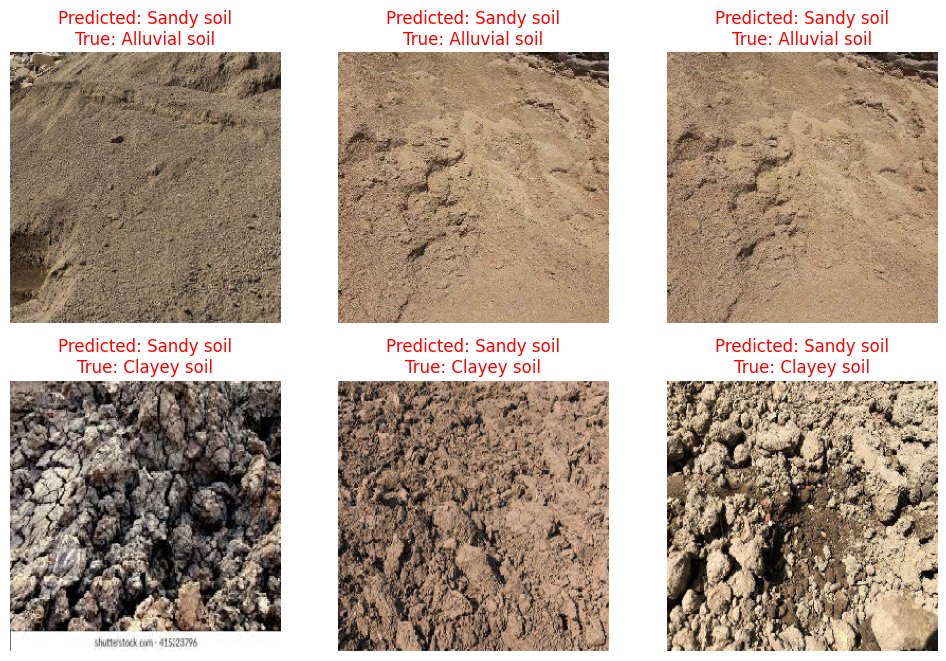

In [ ]:
# Get a batch of images and labels from the test generator
images_2, true_labels_2 = next(test_generator)

# Make predictions on the batch of images
predictions_2 = model_2.predict(images_2)
predicted_labels_2 = np.argmax(predictions_2, axis=1)
predicted_probs_2 = np.max(predictions_2, axis=1)

# Get class labels
class_labels_2 = list(train_generator.class_indices.keys())

# Define colors for correct and incorrect predictions
correct_color_2 = 'green'
incorrect_color_2 = 'red'

# Plot the images with predicted and true labels
plt.figure(figsize=(10, 10))
for i in range(6):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images_2[i])
    if predicted_labels_2[i] == np.argmax(true_labels_2[i]):
        label_color = correct_color_2
    else:
        label_color = incorrect_color_2
    plt.title(f"Predicted: {class_labels_2[predicted_labels_2[i]]}\nTrue: {class_labels_2[np.argmax(true_labels_2[i])]}",
              color=label_color)
    plt.xlabel(f"Probability: {predicted_probs_2[i]:.2f}", color=label_color)
    plt.axis('off')

plt.tight_layout()
plt.show()

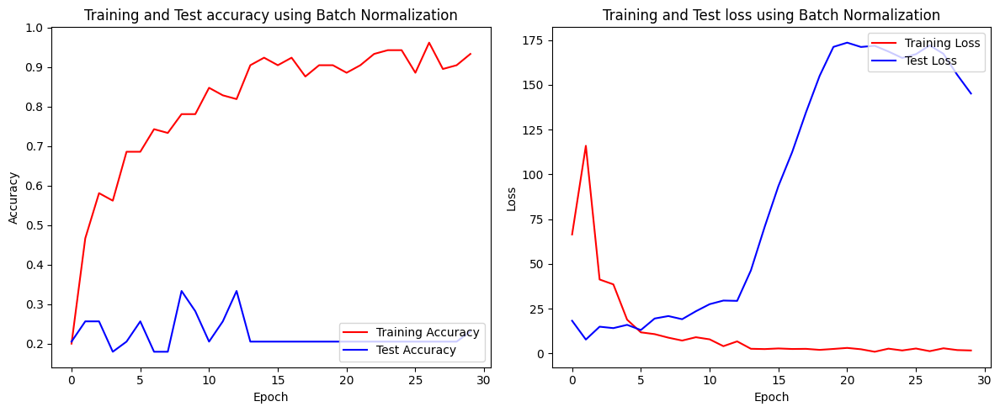

In [ ]:
# Plot the graphs
acc_2 = history.history['accuracy']
test_acc_2 = history.history['val_accuracy']
loss_2 = history.history['loss']
test_loss_2 = history.history['val_loss']

epochs_2 =range(len(acc_2))

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Plot Training and Test accuracy
axes[0].plot(epochs_2, acc_2, 'r', label="Training Accuracy")
axes[0].plot(epochs_2, test_acc_2, 'b', label="Test Accuracy")
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Training and Test accuracy using Batch Normalization')
axes[0].legend(loc='lower right')

# Plot Training and Test loss
axes[1].plot(epochs_2, loss_2, 'r', label="Training Loss")
axes[1].plot(epochs_2, test_loss_2, 'b', label="Test Loss")
axes[1].legend(loc='upper right')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Training and Test loss using Batch Normalization')

plt.tight_layout()
plt.show()

# TEST 2: Using BATCH NORMALIZATION with Early Stopping

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, AveragePooling2D, BatchNormalization, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Building the model
model_3 = Sequential([
    Conv2D(32, (5, 5), activation='relu', padding='same', strides=(1,1), input_shape=(img_height, img_width, 3)),
    BatchNormalization(),
    MaxPooling2D(2, 2),


    Conv2D(64, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Flatten(),

    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    Dense(6, activation='softmax')
])


# Compile the model
model_3.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

# Train the model
history = model_3.fit_generator(train_generator,
                                steps_per_epoch=len(train_generator),
                                epochs=100,
                                verbose=1,
                                validation_data=test_generator,
                                validation_steps=len(test_generator),
                                class_weight=class_weights,
                                callbacks=[early_stopping]
                                )


Epoch 1/100
2/2 [==============================] - 20s 11s/step - loss: 61.7298 - accuracy: 0.2190 - val_loss: 4.6051 - val_accuracy: 0.3846
Epoch 2/100
2/2 [==============================] - 4s 3s/step - loss: 77.3647 - accuracy: 0.4095 - val_loss: 10.3238 - val_accuracy: 0.0769
Epoch 3/100
2/2 [==============================] - 3s 2s/step - loss: 42.5789 - accuracy: 0.6381 - val_loss: 8.7201 - val_accuracy: 0.2051
Epoch 4/100
2/2 [==============================] - 3s 2s/step - loss: 24.9898 - accuracy: 0.6667 - val_loss: 10.0634 - val_accuracy: 0.2051
Epoch 5/100
2/2 [==============================] - 5s 4s/step - loss: 12.2574 - accuracy: 0.7429 - val_loss: 13.2145 - val_accuracy: 0.1795
Epoch 6/100
2/2 [==============================] - 3s 2s/step - loss: 13.7079 - accuracy: 0.7238 - val_loss: 14.8121 - val_accuracy: 0.1795
Epoch 7/100
2/2 [==============================] - 3s 2s/step - loss: 18.0432 - accuracy: 0.7333 - val_loss: 16.1622 - val_accuracy: 0.2821
Epoch 8/100
2/2 [===

In [ ]:
# Evaluate the model
evaluation_3 = model_3.evaluate_generator(test_generator, steps=len(test_generator))

# Print the evaluation results
print("Test Loss:", evaluation_3[0])
print("Test Accuracy:", evaluation_3[1]*100)

Test Loss: 4.605065822601318
Test Accuracy: 38.46153914928436


In [ ]:
# Predictions on the test data
predictions_3 = model_3.predict(test_generator)

# Convert probabilities to class labels
predicted_classes_3 = predictions_3.argmax(axis=1)

# Get true labels
true_classes_3 = test_generator.classes

# Map predicted class indices to class labels
class_labels_3 = list(train_generator.class_indices.keys())
predicted_labels_3 = [class_labels_3[i] for i in predicted_classes_3]

# Print the predicted classes and labels
print("Predicted Classes:", predicted_classes_3)
print("Class Labels:", class_labels_3)
print("Predicted Labels:/n", predicted_labels_3)

# Build classification report
report_3 = classification_report(true_classes_3, predicted_classes_3, target_names=class_labels_3)

# Print the classification report
print(report_3)

1/1 [==============================] - 1s 596ms/step
Predicted Classes: [1 1 1 1 1 1 1 1 1 1 1 4 2 4 2 4 4 4 2 4 4 4 4 4 1 4 1 4 4 1 4 4 4 1 4 4 4
 1 4]
Class Labels: ['Alluvial soil', 'Clayey soil', 'Laterite soil', 'Loamy soil', 'Sandy loam', 'Sandy soil']
Predicted Labels:/n ['Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Sandy loam', 'Laterite soil', 'Sandy loam', 'Laterite soil', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Laterite soil', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Clayey soil', 'Sandy loam', 'Clayey soil', 'Sandy loam', 'Sandy loam', 'Clayey soil', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Clayey soil', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Clayey soil', 'Sandy loam']
               precision    recall  f1-score   support

Alluvial soil       0.00      0.00      0.00         3
  Clayey soil       0.50      1.00    

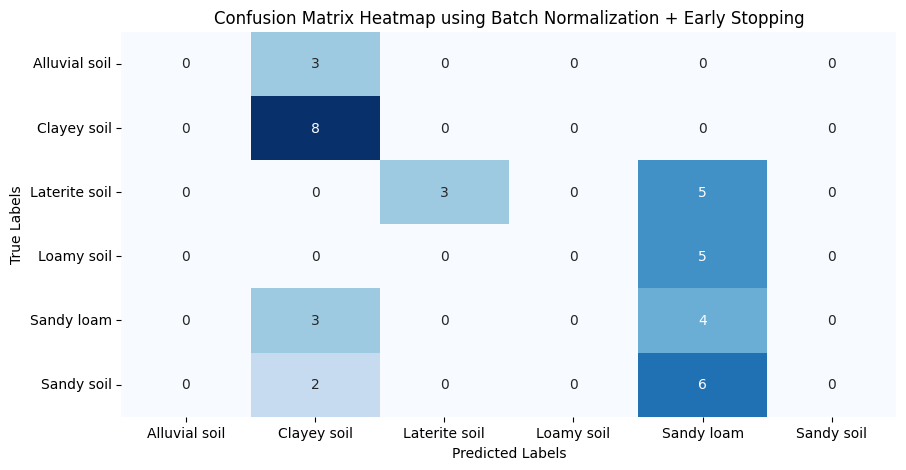

In [ ]:
# Calculate confusion matrix
conf_matrix_3 = confusion_matrix(true_classes_3, predicted_classes_3)

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix_3, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels_3, yticklabels=class_labels_3)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap using Batch Normalization + Early Stopping')
plt.show()

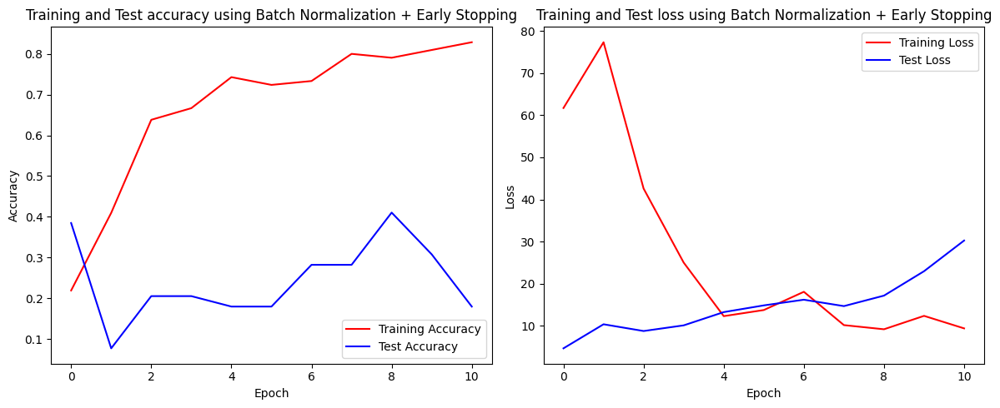

In [ ]:
# Plot the graphs
acc_3 = history.history['accuracy']
test_acc_3 = history.history['val_accuracy']
loss_3 = history.history['loss']
test_loss_3 = history.history['val_loss']

epochs_3 =range(len(acc_3))

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Plot Training and Test accuracy
axes[0].plot(epochs_3, acc_3, 'r', label="Training Accuracy")
axes[0].plot(epochs_3, test_acc_3, 'b', label="Test Accuracy")
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Training and Test accuracy using Batch Normalization + Early Stopping')
axes[0].legend(loc='lower right')

# Plot Training and Test loss
axes[1].plot(epochs_3, loss_3, 'r', label="Training Loss")
axes[1].plot(epochs_3, test_loss_3, 'b', label="Test Loss")
axes[1].legend(loc='upper right')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Training and Test loss using Batch Normalization + Early Stopping')

plt.tight_layout()
plt.show()

2/2 [==============================] - 0s 27ms/step


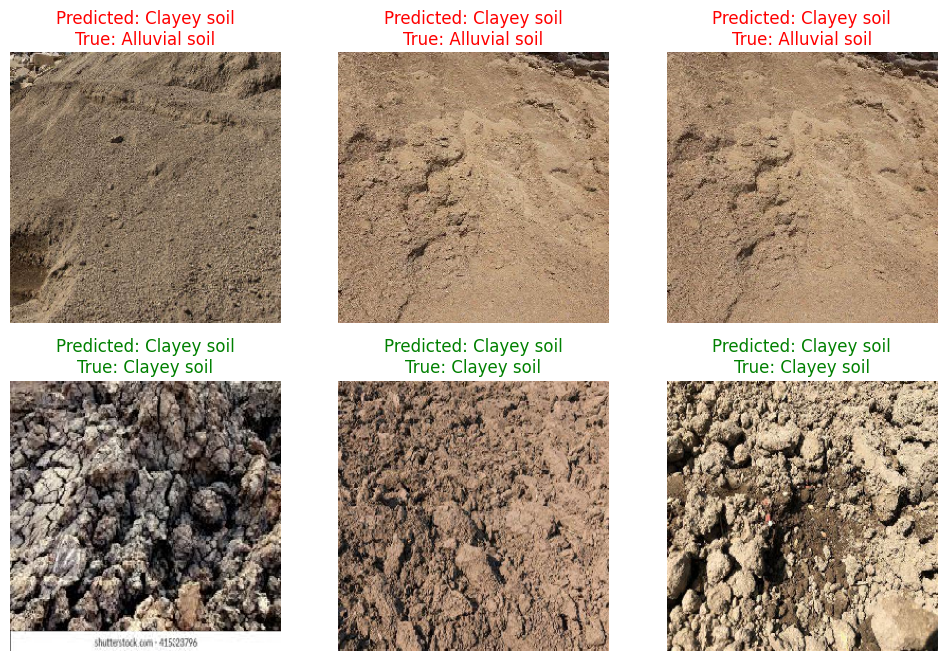

In [ ]:
# Get a batch of images and labels from the test generator
images_3, true_labels_3 = next(test_generator)

# Make predictions on the batch of images
predictions_3 = model_3.predict(images_3)
predicted_labels_3 = np.argmax(predictions_3, axis=1)
predicted_probs_3 = np.max(predictions_3, axis=1)

# Get class labels
class_labels_3 = list(train_generator.class_indices.keys())

# Define colors for correct and incorrect predictions
correct_color = 'green'
incorrect_color = 'red'

# Plot the images with predicted and true labels
plt.figure(figsize=(10, 10))
for i in range(6):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images_3[i])
    if predicted_labels_3[i] == np.argmax(true_labels_3[i]):
        label_color = correct_color
    else:
        label_color = incorrect_color
    plt.title(f"Predicted: {class_labels_3[predicted_labels_3[i]]}\nTrue: {class_labels_3[np.argmax(true_labels_3[i])]}",
              color=label_color)
    plt.xlabel(f"Probability: {predicted_probs_3[i]:.2f}", color=label_color)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Part 3.  USING Only DropOut

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight

# Define early stopping callback
#early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Building the model
model_4 = Sequential([
    Conv2D(32, (5, 5), activation='relu', padding='same', strides=(1,1), input_shape=(img_height, img_width, 3)),
    #BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    #BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    #BatchNormalization(),
    MaxPooling2D(2, 2),

    Flatten(),

    Dropout(0.2),
    Dense(512, activation='relu'),
    #Dropout(0.5),  # Add Dropout after the last MaxPooling2D layer
    Dense(256, activation='relu'),
    Dense(6, activation='softmax')
])

model_4.summary()

# Compile the model
model_4.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

# Train the model
history = model_4.fit_generator(train_generator,
                                steps_per_epoch=len(train_generator),
                                epochs=30,
                                verbose=1,
                                validation_data=test_generator,
                                validation_steps=len(test_generator),
                                class_weight=class_weights,
                                #callbacks=[early_stopping]
                                )

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 128)       0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 524288)            0

In [ ]:
# Evaluate the model
evaluation_4 = model_4.evaluate_generator(test_generator, steps=len(test_generator))

# Print the evaluation results
print("Test Loss:", evaluation_4[0])
print("Test Accuracy:", evaluation_4[1]*100)

Test Loss: 0.7128844857215881
Test Accuracy: 69.2307710647583


In [ ]:
# Predictions on the test data
predictions_4 = model_4.predict(test_generator)

# Convert probabilities to class labels
predicted_classes_4 = predictions_4.argmax(axis=1)

# Get true labels
true_classes_4 = test_generator.classes

# Map predicted class indices to class labels
class_labels_4 = list(train_generator.class_indices.keys())
predicted_labels_4 = [class_labels_4[i] for i in predicted_classes_4]

# Print the predicted classes and labels
print("Predicted Classes:", predicted_classes_4)
print("Class Labels:", class_labels_4)
print("Predicted Labels:/n", predicted_labels_4)

# Build classification report
report_4 = classification_report(true_classes_4, predicted_classes_4, target_names=class_labels_4)

# Print the classification report
print(report_4)

1/1 [==============================] - 4s 4s/step
Predicted Classes: [1 0 0 1 5 1 1 5 1 1 1 2 2 2 2 2 4 2 2 5 3 4 3 5 4 4 4 5 4 0 4 5 4 5 5 5 4
 5 4]
Class Labels: ['Alluvial soil', 'Clayey soil', 'Laterite soil', 'Loamy soil', 'Sandy loam', 'Sandy soil']
Predicted Labels:/n ['Clayey soil', 'Alluvial soil', 'Alluvial soil', 'Clayey soil', 'Sandy soil', 'Clayey soil', 'Clayey soil', 'Sandy soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Sandy loam', 'Laterite soil', 'Laterite soil', 'Sandy soil', 'Loamy soil', 'Sandy loam', 'Loamy soil', 'Sandy soil', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Sandy soil', 'Sandy loam', 'Alluvial soil', 'Sandy loam', 'Sandy soil', 'Sandy loam', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy loam', 'Sandy soil', 'Sandy loam']
               precision    recall  f1-score   support

Alluvial soil       0.67      0.67      0.67         3
  Clayey soil       0.86     

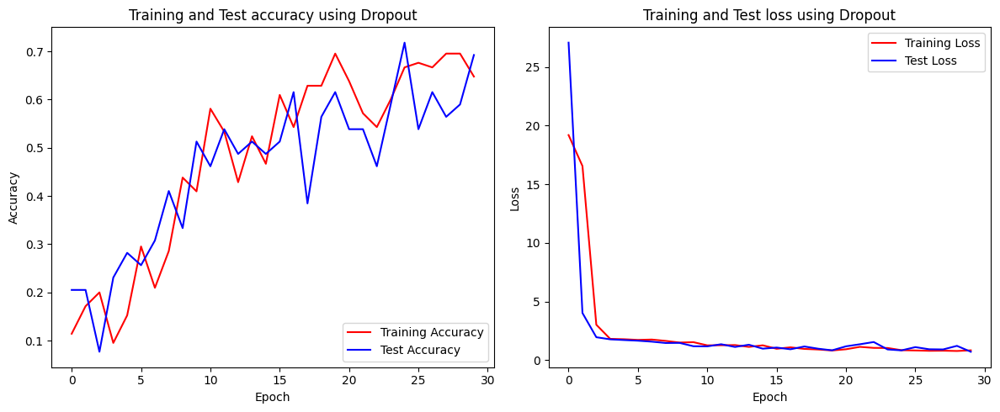

In [ ]:
# Plot the graphs
acc_4 = history.history['accuracy']
test_acc_4 = history.history['val_accuracy']
loss_4 = history.history['loss']
test_loss_4 = history.history['val_loss']

epochs_4 =range(len(acc_4))

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Plot Training and Test accuracy
axes[0].plot(epochs_4, acc_4, 'r', label="Training Accuracy")
axes[0].plot(epochs_4, test_acc_4, 'b', label="Test Accuracy")
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Training and Test accuracy using Dropout')
axes[0].legend(loc='lower right')

# Plot Training and Test loss
axes[1].plot(epochs_4, loss_4, 'r', label="Training Loss")
axes[1].plot(epochs_4, test_loss_4, 'b', label="Test Loss")
axes[1].legend(loc='upper right')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Training and Test loss using Dropout')

plt.tight_layout()
plt.show()

# Part 4.  USING Dropout and Early Stopping

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils.class_weight import compute_class_weight

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Building the model
model_5 = Sequential([
    Conv2D(32, (5, 5), activation='relu', padding='same', strides=(1,1), input_shape=(img_height, img_width, 3)),
    #BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    #BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    #BatchNormalization(),
    MaxPooling2D(2, 2),

    Flatten(),

    Dropout(0.2),
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    Dense(6, activation='softmax')
])

model_5.summary()

# Compile the model
model_5.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

# Train the model
history = model_5.fit_generator(train_generator,
                                steps_per_epoch=len(train_generator),
                                epochs=100,
                                verbose=1,
                                validation_data=test_generator,
                                validation_steps=len(test_generator),
                                class_weight=class_weights,
                                callbacks=[early_stopping]
                                )

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 256, 256, 32)      2432      
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 128, 128, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 64, 64, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 64, 64, 128)       73856     
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 32, 32, 128)      

In [ ]:
# Evaluate the model
evaluation_5 = model_5.evaluate_generator(test_generator, steps=len(test_generator))

# Print the evaluation results
print("Test Loss:", evaluation_5[0])
print("Test Accuracy:", evaluation_5[1]*100)

Test Loss: 0.4612289369106293
Test Accuracy: 84.61538553237915


In [ ]:
# Predictions on the test data
predictions_5 = model_5.predict(test_generator)

# Convert probabilities to class labels
predicted_classes_5 = predictions_5.argmax(axis=1)

# Get true labels
true_classes_5 = test_generator.classes

# Map predicted class indices to class labels
class_labels_5 = list(train_generator.class_indices.keys())
predicted_labels_5 = [class_labels_5[i] for i in predicted_classes_5]

# Print the predicted classes and labels
print("Predicted Classes:", predicted_classes_5)
print("Class Labels:", class_labels_5)
print("Predicted Labels:/n", predicted_labels_5)

# Build classification report
report_5 = classification_report(true_classes_5, predicted_classes_5, target_names=class_labels_5)

# Print the classification report
print(report_5)

1/1 [==============================] - 1s 552ms/step
Predicted Classes: [1 0 0 1 1 1 1 1 1 1 1 2 2 2 2 2 3 3 2 3 3 3 3 3 4 4 4 4 4 0 4 5 5 5 5 3 4
 5 5]
Class Labels: ['Alluvial soil', 'Clayey soil', 'Laterite soil', 'Loamy soil', 'Sandy loam', 'Sandy soil']
Predicted Labels:/n ['Clayey soil', 'Alluvial soil', 'Alluvial soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Loamy soil', 'Loamy soil', 'Laterite soil', 'Loamy soil', 'Loamy soil', 'Loamy soil', 'Loamy soil', 'Loamy soil', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Alluvial soil', 'Sandy loam', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Sandy soil', 'Loamy soil', 'Sandy loam', 'Sandy soil', 'Sandy soil']
               precision    recall  f1-score   support

Alluvial soil       0.67      0.67      0.67         3
  Clayey soil       0.89   

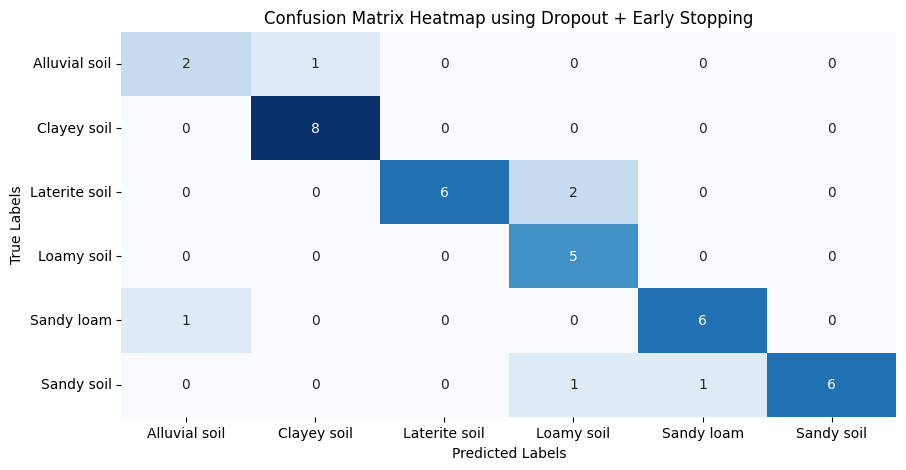

In [ ]:
# Calculate confusion matrix
conf_matrix_5 = confusion_matrix(true_classes_5, predicted_classes_5)

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix_5, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels_5, yticklabels=class_labels_5)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap using Dropout + Early Stopping')
plt.show()

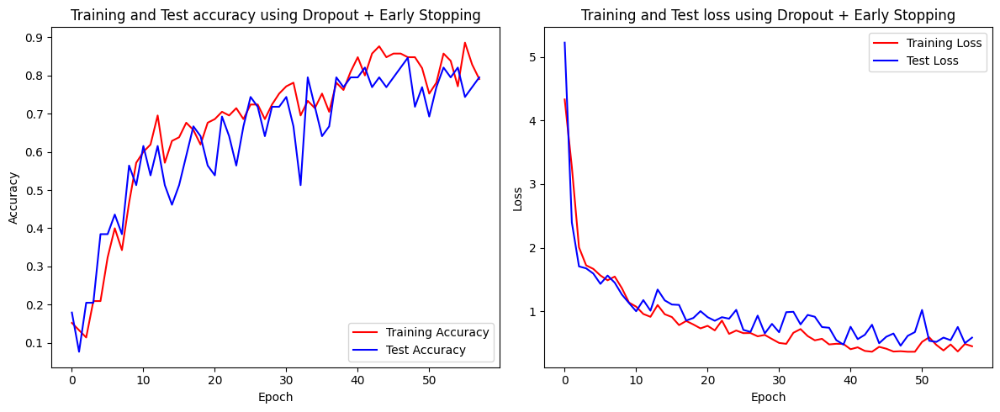

In [ ]:
# Plot the graphs
acc_5 = history.history['accuracy']
test_acc_5 = history.history['val_accuracy']
loss_5 = history.history['loss']
test_loss_5 = history.history['val_loss']

epochs_5 =range(len(acc_5))

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Plot Training and Test accuracy
axes[0].plot(epochs_5, acc_5, 'r', label="Training Accuracy")
axes[0].plot(epochs_5, test_acc_5, 'b', label="Test Accuracy")
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Training and Test accuracy using Dropout + Early Stopping')
axes[0].legend(loc='lower right')

# Plot Training and Test loss
axes[1].plot(epochs_5, loss_5, 'r', label="Training Loss")
axes[1].plot(epochs_5, test_loss_5, 'b', label="Test Loss")
axes[1].legend(loc='upper right')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Training and Test loss using Dropout + Early Stopping')

plt.tight_layout()
plt.show()

2/2 [==============================] - 0s 21ms/step


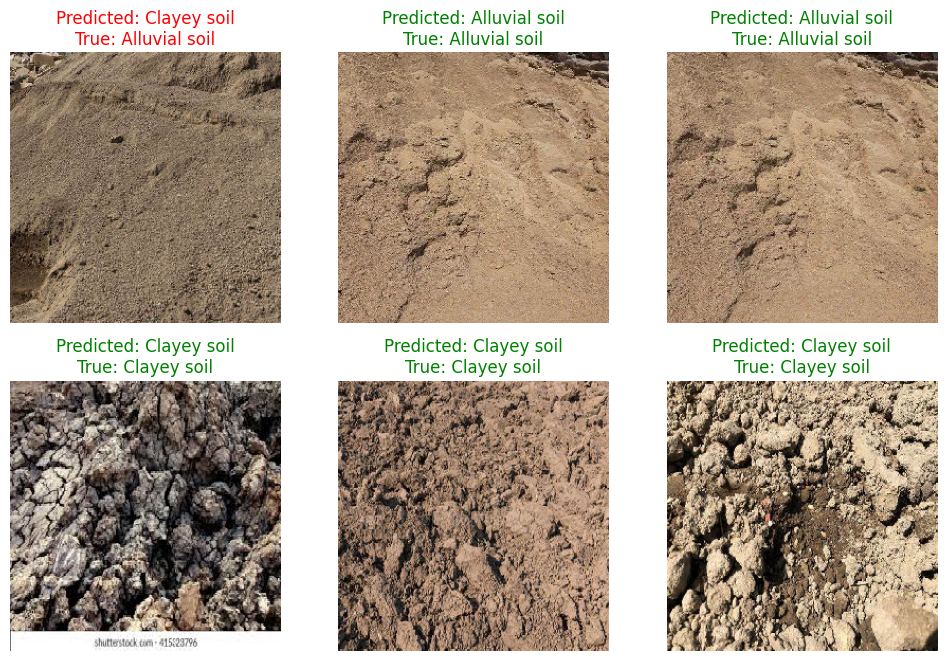

In [ ]:
# Get a batch of images and labels from the test generator
images_5, true_labels_5 = next(test_generator)

# Make predictions on the batch of images
predictions_5 = model_5.predict(images_3)
predicted_labels_5 = np.argmax(predictions_5, axis=1)
predicted_probs_5 = np.max(predictions_5, axis=1)

# Get class labels
class_labels_5 = list(train_generator.class_indices.keys())

# Define colors for correct and incorrect predictions
correct_color = 'green'
incorrect_color = 'red'

# Plot the images with predicted and true labels
plt.figure(figsize=(10, 10))
for i in range(6):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images_5[i])
    if predicted_labels_5[i] == np.argmax(true_labels_5[i]):
        label_color = correct_color
    else:
        label_color = incorrect_color
    plt.title(f"Predicted: {class_labels_5[predicted_labels_5[i]]}\nTrue: {class_labels_5[np.argmax(true_labels_5[i])]}",
              color=label_color)
    plt.xlabel(f"Probability: {predicted_probs_5[i]:.2f}", color=label_color)
    plt.axis('off')

plt.tight_layout()
plt.show()

# ALEX NET MODEL

In [ ]:
# Balance the class weights
from sklearn.utils.class_weight import compute_class_weight
# Get class indices
class_indices = train_generator.classes
print(class_indices)


# Calculate class weights
class_labels = np.unique(train_generator.classes)
print(class_labels)

class_weights = compute_class_weight(class_weight = "balanced",classes = np.unique(class_indices), y = class_indices)

class_weights = dict(zip(np.unique(class_indices), class_weights))
class_weights

[0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
[0 1 2 3 4 5]


{0: 2.1875,
 1: 0.8333333333333334,
 2: 0.8333333333333334,
 3: 1.4583333333333333,
 4: 0.9210526315789473,
 5: 0.7291666666666666}

In [ ]:
# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Build the ALEX NET model
model_alex_net = Sequential([
    Conv2D(96, (11, 11), activation='relu', padding='same', strides=(4, 4), input_shape=(img_height, img_width, 3)),
    MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
    BatchNormalization(),

    Conv2D(256, (5, 5), activation='relu', padding='same', strides=(1, 1)),
    MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
    BatchNormalization(),

    Conv2D(384, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    BatchNormalization(),

    Conv2D(384, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    BatchNormalization(),

    Conv2D(256, (3, 3), activation='relu', padding='same', strides=(1, 1)),
    MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
    BatchNormalization(),

    Flatten(),

    Dense(4096, activation='relu'),
    Dropout(0.5),

    Dense(4096, activation='relu'),
    Dropout(0.5),

    Dense(6, activation='softmax')
])

# Display model summary
model_alex_net.summary()

# Compile the model
model_alex_net.compile(loss='categorical_crossentropy',
                       optimizer='adam',
                       metrics=['accuracy'])

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 64, 64, 96)        34944     
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 31, 31, 96)        0         
 ng2D)                                                           
                                                                 
 batch_normalization_3 (Bat  (None, 31, 31, 96)        384       
 chNormalization)                                                
                                                                 
 conv2d_19 (Conv2D)          (None, 31, 31, 256)       614656    
                                                                 
 max_pooling2d_19 (MaxPooli  (None, 15, 15, 256)       0         
 ng2D)                                                           
                                                      

In [ ]:
# Train the model
history = model_alex_net.fit_generator(train_generator,
                                steps_per_epoch=len(train_generator),
                                epochs=100,
                                verbose=1,
                                validation_data=test_generator,
                                validation_steps=len(test_generator),
                                class_weight=class_weights,
                                callbacks=[early_stopping])

Epoch 1/100
2/2 [==============================] - 21s 10s/step - loss: 13.5937 - accuracy: 0.1714 - val_loss: 11.1316 - val_accuracy: 0.2051
Epoch 2/100
2/2 [==============================] - 3s 1s/step - loss: 37.8036 - accuracy: 0.3238 - val_loss: 143.4163 - val_accuracy: 0.2051
Epoch 3/100
2/2 [==============================] - 5s 3s/step - loss: 29.5754 - accuracy: 0.2952 - val_loss: 333.7625 - val_accuracy: 0.0769
Epoch 4/100
2/2 [==============================] - 3s 1s/step - loss: 14.5374 - accuracy: 0.4762 - val_loss: 134.1745 - val_accuracy: 0.2308
Epoch 5/100
2/2 [==============================] - 3s 2s/step - loss: 11.9478 - accuracy: 0.5048 - val_loss: 281.9888 - val_accuracy: 0.2051
Epoch 6/100
2/2 [==============================] - 7s 5s/step - loss: 8.3380 - accuracy: 0.5238 - val_loss: 412.2014 - val_accuracy: 0.1795
Epoch 7/100
2/2 [==============================] - 3s 2s/step - loss: 7.6194 - accuracy: 0.6190 - val_loss: 1032.1600 - val_accuracy: 0.2051
Epoch 8/100
2

In [ ]:
# Evaluate the model
evaluation_alex_net = model_alex_net.evaluate_generator(test_generator, steps=len(test_generator))

# Print the evaluation results
print("Test Loss:", evaluation_alex_net[0])
print("Test Accuracy:", evaluation_alex_net[1]*100)

Test Loss: 11.13160228729248
Test Accuracy: 20.512820780277252


In [ ]:
# Predictions on the test data
predictions_alex_net = model_alex_net.predict(test_generator)

# Convert probabilities to class labels
predicted_classes_alex_net = predictions_alex_net.argmax(axis=1)

# Get true labels
true_classes_alex_net = test_generator.classes

# Map predicted class indices to class labels
class_labels_alex_net = list(train_generator.class_indices.keys())
predicted_labels_alex_net = [class_labels_alex_net[i] for i in predicted_classes_alex_net]

# Print the predicted classes and labels
print("Predicted Classes:", predicted_classes_alex_net)
print("Class Labels:", class_labels_alex_net)
print("Predicted Labels:/n", predicted_labels_alex_net)

# Build classification report
report_alex_net = classification_report(true_classes_alex_net, predicted_classes_alex_net, target_names=class_labels_alex_net)

# Print the classification report
print(report_alex_net)

1/1 [==============================] - 1s 642ms/step
Predicted Classes: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]
Class Labels: ['Alluvial soil', 'Clayey soil', 'Laterite soil', 'Loamy soil', 'Sandy loam', 'Sandy soil']
Predicted Labels:/n ['Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil']
               precision    recall  f1-score   support

Alluvial soil       0.00      0.00      0.00         3
  Clayey soil       0.21

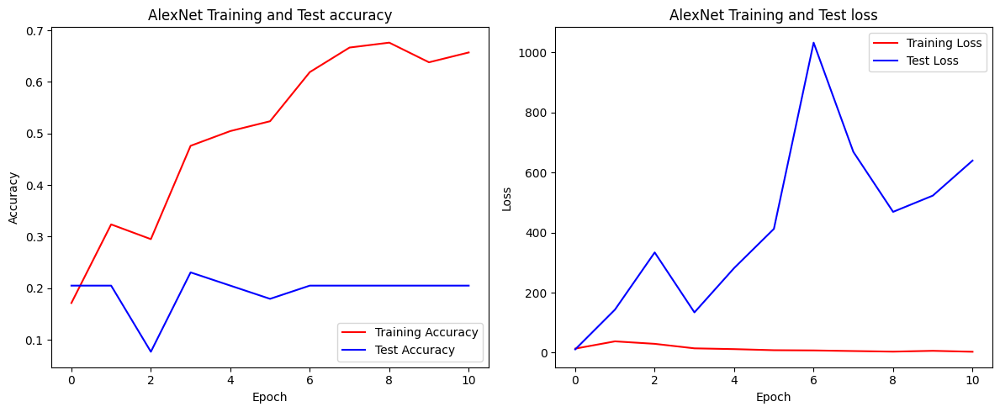

In [ ]:
# Plot the Train vs Test Accuracy
acc_alex_net = history.history['accuracy']
test_acc_alex_net = history.history['val_accuracy']
loss_alex_net = history.history['loss']
test_loss_alex_net = history.history['val_loss']

epochs = range(len(acc_alex_net))

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Plot Training and Test accuracy
axes[0].plot(epochs, acc_alex_net, 'r', label="Training Accuracy")
axes[0].plot(epochs, test_acc_alex_net, 'b', label="Test Accuracy")
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('AlexNet Training and Test accuracy')
axes[0].legend(loc='lower right')

# Plot Training and Test loss
axes[1].plot(epochs, loss_alex_net, 'r', label="Training Loss")
axes[1].plot(epochs, test_loss_alex_net, 'b', label="Test Loss")
axes[1].legend(loc='upper right')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('AlexNet Training and Test loss')

plt.tight_layout()
plt.show()

# Hyperparameter Tuning

######Note: Since the initial tests resulted in Dropout + Early Stopping resulting in the best accuracy, only Dropout and Early Stopping has been considered for tuning.

### Hyperparameter tuning using Keras Tuner

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
# Get class indices
class_indices = train_generator.classes
print(class_indices)


# Calculate class weights
class_labels = np.unique(train_generator.classes)
print(class_labels)

class_weights = compute_class_weight(class_weight = "balanced",classes = np.unique(class_indices), y = class_indices)

class_weights = dict(zip(np.unique(class_indices), class_weights))
class_weights

[0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
[0 1 2 3 4 5]


{0: 2.1875,
 1: 0.8333333333333334,
 2: 0.8333333333333334,
 3: 1.4583333333333333,
 4: 0.9210526315789473,
 5: 0.7291666666666666}

In [ ]:
#!pip install keras-tuner --upgrade
import kerastuner as kt

In [ ]:
#!pip install keras-tuner --upgrade
import kerastuner as kt
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping

# Function to build the model with tunable hyperparameters
def soil_classification_model(hp):

    model = Sequential()
    model.add(Conv2D(filters=hp.Int('conv1_units', min_value=32, max_value=128, step=32),
                     kernel_size=(5, 5),
                     activation='relu',
                     padding='same',
                     strides=(1, 1),
                     input_shape=(img_height, img_width, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=hp.Int('conv2_units', min_value=32, max_value=128, step=32),
                     kernel_size=(3, 3),
                     activation='relu',
                     padding='same',
                     strides=(1, 1)))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=hp.Int('conv3_units', min_value=32, max_value=128, step=32),
                     kernel_size=(3, 3),
                     activation='relu',
                     padding='same',
                     strides=(1, 1)))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dropout(0.2))
    model.add(Dense(units=hp.Int('dense1_units', min_value=128, max_value=512, step=128), activation='relu'))
    model.add(Dense(units=hp.Int('dense2_units', min_value=64, max_value=256, step=64), activation='relu'))
    model.add(Dense(6, activation='softmax'))


    # Set a learning rate
    lr = hp.Choice('learning_rate', values=[0.001, 0.1])
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Instantiate the tuner
tuner = kt.Hyperband(soil_classification_model,
                     objective='val_accuracy',
                     max_epochs=10,
                     factor=3,
                     directory='my_dir',
                     project_name='soil_classification_hyperparameter_tuning'
                     )

# Perform the hyperparameter search
tuner.search(train_generator,
             steps_per_epoch=len(train_generator),
             epochs=5,
             validation_data=test_generator,
             validation_steps=len(test_generator),
             callbacks=[early_stopping])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the model with the best hyperparameters
best_model = tuner.hypermodel.build(best_hps)

# Train the model with the best hyperparameters
history = best_model.fit_generator(train_generator,
                         steps_per_epoch=len(train_generator),
                         epochs=30,
                         verbose=1,
                         validation_data=test_generator,
                         validation_steps=len(test_generator),
                         class_weight=class_weights,
                         callbacks=[early_stopping]
                         )

Trial 30 Complete [00h 12m 37s]
val_accuracy: 0.43589743971824646

Best val_accuracy So Far: 0.5641025900840759
Total elapsed time: 01h 46m 05s
Epoch 1/30
2/2 [==============================] - 35s 15s/step - loss: 1.8357 - accuracy: 0.1714 - val_loss: 1.8488 - val_accuracy: 0.2051
Epoch 2/30
2/2 [==============================] - 33s 20s/step - loss: 1.8269 - accuracy: 0.2190 - val_loss: 1.7875 - val_accuracy: 0.2051
Epoch 3/30
2/2 [==============================] - 32s 15s/step - loss: 1.8060 - accuracy: 0.1524 - val_loss: 1.7292 - val_accuracy: 0.2051
Epoch 4/30
2/2 [==============================] - 32s 19s/step - loss: 1.6720 - accuracy: 0.2762 - val_loss: 1.6273 - val_accuracy: 0.3077
Epoch 5/30
2/2 [==============================] - 33s 14s/step - loss: 1.6114 - accuracy: 0.2762 - val_loss: 1.4401 - val_accuracy: 0.4872
Epoch 6/30
2/2 [==============================] - 32s 20s/step - loss: 1.4082 - accuracy: 0.5619 - val_loss: 1.5011 - val_accuracy: 0.2564
Epoch 7/30
2/2 [======

In [ ]:
# Optimal Hyperparameters
# Get the best hyperparameters
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print the best hyperparameters
print("Best Hyperparameters:")
print(best_hyperparameters.values)

Best Hyperparameters:
{'conv1_units': 96, 'conv2_units': 32, 'conv3_units': 32, 'dense1_units': 128, 'dense2_units': 192, 'learning_rate': 0.001, 'tuner/epochs': 10, 'tuner/initial_epoch': 4, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0023'}


In [ ]:
# Evaluate the model on the test data
tuned_test_loss, tuned_test_accuracy = best_model.evaluate(test_generator, steps=len(test_generator))
print("Test Loss:", tuned_test_loss)
print("Test Accuracy:", tuned_test_accuracy * 100)

1/1 [==============================] - 5s 5s/step - loss: 0.9087 - accuracy: 0.6410
Test Loss: 0.9087409973144531
Test Accuracy: 64.10256624221802


In [ ]:
# Predictions on the test data
predictions_best_model = best_model.predict(test_generator)

# Convert probabilities to class labels
predicted_classes_best_model = predictions_best_model.argmax(axis=1)

# Get true labels
true_classes = test_generator.classes

# Map predicted class indices to class labels
class_labels = list(train_generator.class_indices.keys())
predicted_labels_best_model = [class_labels[i] for i in predicted_classes_best_model]

# Print the predicted classes and labels
print("Predicted Classes:", predicted_classes_best_model)
print("Class Labels:", class_labels)
print("Predicted Labels:/n", predicted_labels_best_model)

# Build classification report
best_model_report = classification_report(true_classes, predicted_classes_best_model, target_names=class_labels)

# Print the classification report
print(best_model_report)

1/1 [==============================] - 5s 5s/step
Predicted Classes: [1 0 0 1 1 1 1 5 1 1 1 2 2 2 2 2 3 3 2 3 3 4 3 3 4 4 4 3 4 0 4 3 4 1 3 3 4
 5 3]
Class Labels: ['Alluvial soil', 'Clayey soil', 'Laterite soil', 'Loamy soil', 'Sandy loam', 'Sandy soil']
Predicted Labels:/n ['Clayey soil', 'Alluvial soil', 'Alluvial soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Sandy soil', 'Clayey soil', 'Clayey soil', 'Clayey soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Laterite soil', 'Loamy soil', 'Loamy soil', 'Laterite soil', 'Loamy soil', 'Loamy soil', 'Sandy loam', 'Loamy soil', 'Loamy soil', 'Sandy loam', 'Sandy loam', 'Sandy loam', 'Loamy soil', 'Sandy loam', 'Alluvial soil', 'Sandy loam', 'Loamy soil', 'Sandy loam', 'Clayey soil', 'Loamy soil', 'Loamy soil', 'Sandy loam', 'Sandy soil', 'Loamy soil']
               precision    recall  f1-score   support

Alluvial soil       0.67      0.67      0.67         3
  Clayey soil       0.78      

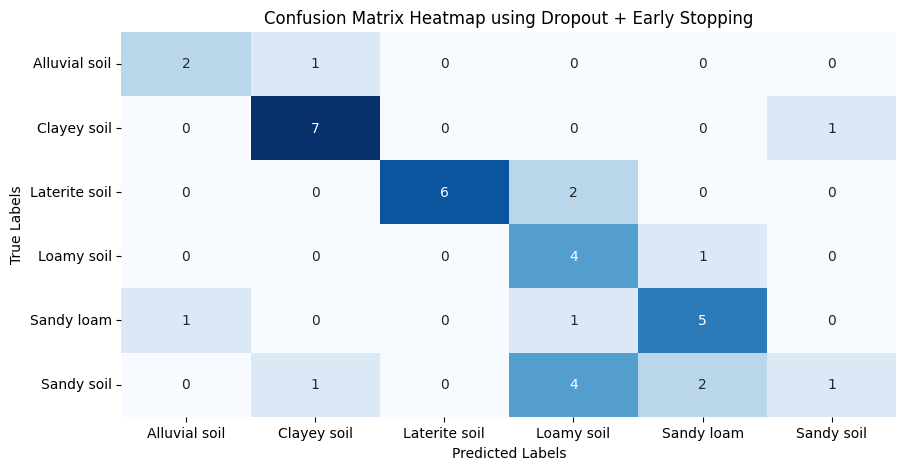

In [ ]:
# Calculate confusion matrix
confusion_matrix_best_model = confusion_matrix(true_classes, predicted_classes_best_model)

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(confusion_matrix_best_model, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap using Optimal Parameters')
plt.show()

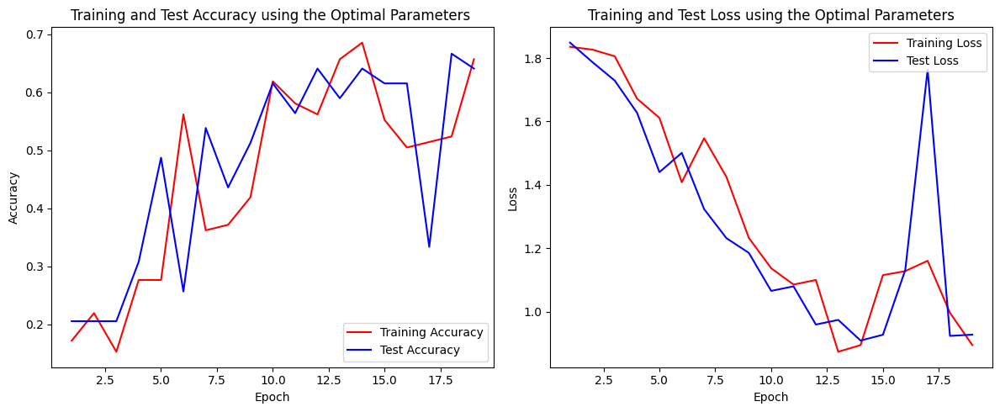

In [ ]:
best_model_acc = history.history['accuracy']
best_model_val_acc = history.history['val_accuracy']
best_loss = history.history['loss']
best_val_loss = history.history['val_loss']

best_epochs = range(1, len(best_model_acc) + 1)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot training and test accuracy
axes[0].plot(best_epochs, best_model_acc, 'r', label='Training Accuracy')
axes[0].plot(best_epochs, best_model_val_acc, 'b', label='Test Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Training and Test Accuracy using the Optimal Parameters ')
axes[0].legend(loc ='lower right')

# Plot training and test loss
axes[1].plot(best_epochs, best_loss, 'r', label='Training Loss')
axes[1].plot(best_epochs, best_val_loss, 'b', label='Test Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Training and Test Loss using the Optimal Parameters')
axes[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()

2/2 [==============================] - 3s 538ms/step


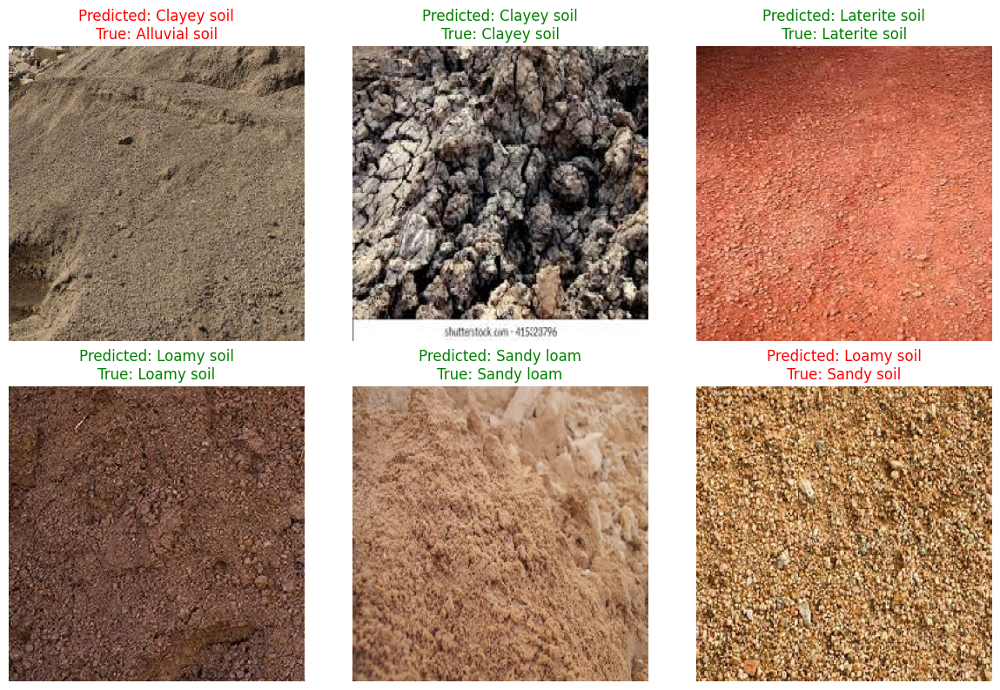

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Get a batch of images and labels from the test generator
images_best_model, true_labels_best_model = next(test_generator)

# Make predictions on the batch of images
predictions_best_model = best_model.predict(images_best_model)
predicted_labels_best_model = np.argmax(predictions_best_model, axis=1)
predicted_probs_best_model = np.max(predictions_best_model, axis=1)

# Get class labels
class_labels = list(train_generator.class_indices.keys())

# Define colors for correct and incorrect predictions
correct_color = 'green'
incorrect_color = 'red'

# Plot the images with predicted and true labels
plt.figure(figsize=(12, 8))

# Initialize a dictionary to keep track of whether each class has been plotted
class_plotted = {class_label: False for class_label in class_labels}

# Plot at least one image from each class
for i in range(len(images_best_model)):
    true_label = np.argmax(true_labels_best_model[i])
    if not class_plotted[class_labels[true_label]]:
        plt.subplot(2, 3, true_label + 1)
        plt.imshow(images_best_model[i])
        if predicted_labels_best_model[i] == true_label:
            label_color = correct_color
        else:
            label_color = incorrect_color
        plt.title(f"Predicted: {class_labels[predicted_labels_best_model[i]]}\nTrue: {class_labels[true_label]}",
                  color=label_color)
        plt.xlabel(f"Probability: {predicted_probs_best_model[i]:.2f}", color=label_color)
        plt.axis('off')
        class_plotted[class_labels[true_label]] = True

# Add empty subplots for classes that are not present in the current batch
for class_label, plotted in class_plotted.items():
    if not plotted:
        plt.subplot(2, 3, class_labels.index(class_label) + 1)
        plt.axis('off')

plt.tight_layout()
plt.show()